In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [2]:
dataset = pd.read_csv('data.csv')

In [3]:
X = dataset.iloc[:, 1:31].values
Y = dataset.iloc[:, 31].values

In [4]:
dataset.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
print("Cancer data set dimensions : {}".format(dataset.shape))

Cancer data set dimensions : (569, 33)


In [6]:
diagnosis_unique = dataset.diagnosis.unique()
print(diagnosis_unique)

['M' 'B']


In [7]:
benign,malignant=dataset["diagnosis"].value_counts()

In [8]:
print('Number of cells labeled Benign: ', benign)
print('Number of cells labeled Malignant : ', malignant)

Number of cells labeled Benign:  357
Number of cells labeled Malignant :  212


In [9]:
print('% of cells labeled Benign', round(benign / len(dataset) * 100, 2), '%')
print('% of cells labeled Malignant', round(malignant / len(dataset) * 100, 2), '%')

% of cells labeled Benign 62.74 %
% of cells labeled Malignant 37.26 %


C:\Users\Parimala Ramisetty\AppData\Local\Temp\ipykernel_11092\1825958619.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 2)


<AxesSubplot: title={'center': 'Counts of Diagnosis'}, xlabel='diagnosis', ylabel='count'>

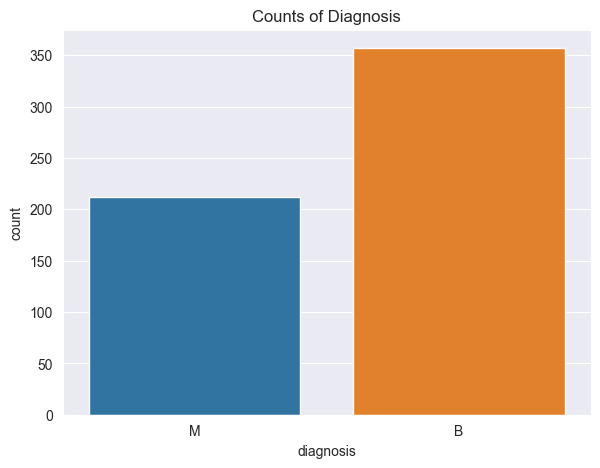

In [10]:
sns.set_style('darkgrid')
plt.figure(figsize=(15, 5))
plt.xlabel("Diagnosis")
plt.subplot(1, 2, 2)
plt.title("Counts of Diagnosis")
sns.countplot(x='diagnosis', data=dataset)

In [11]:
dataset.isnull()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
565,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
566,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
567,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [12]:
dataset.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

diagnosis
B    [[AxesSubplot(0.125,0.777333;0.103333x0.102667...
M    [[AxesSubplot(0.125,0.777333;0.103333x0.102667...
dtype: object

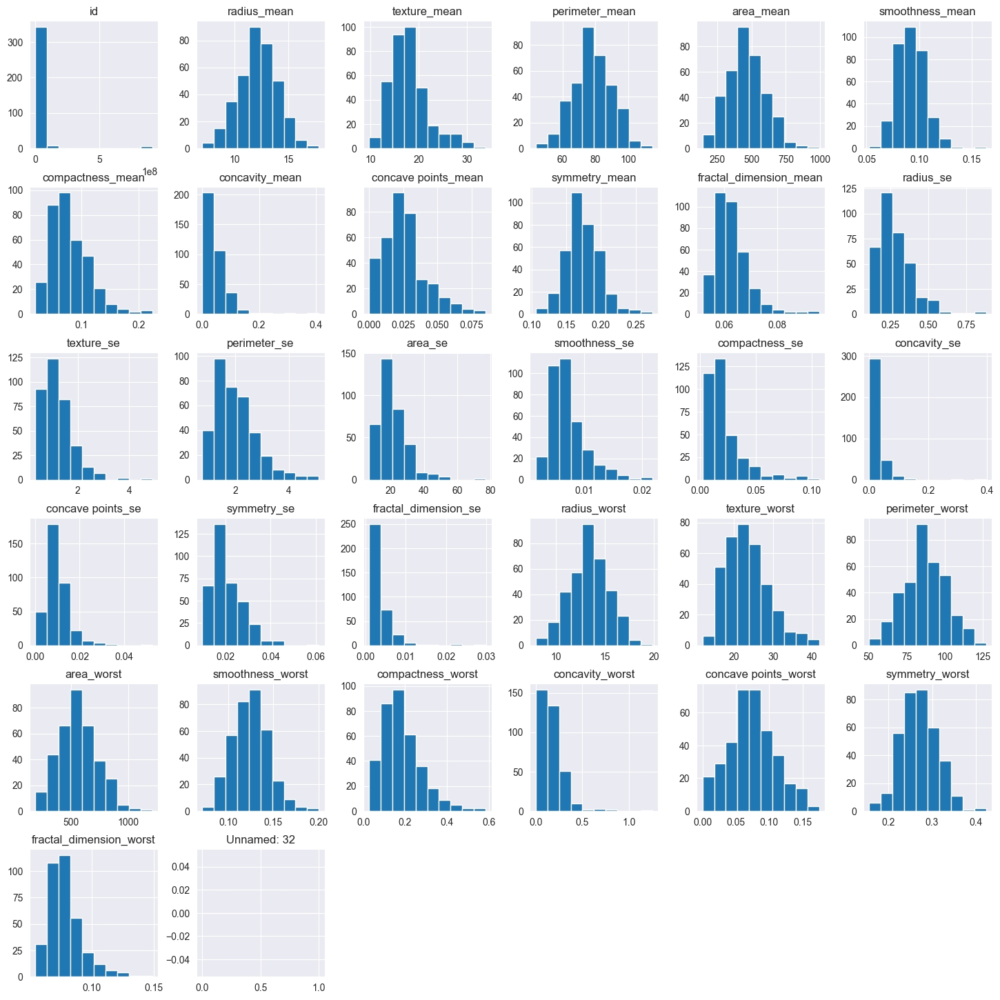

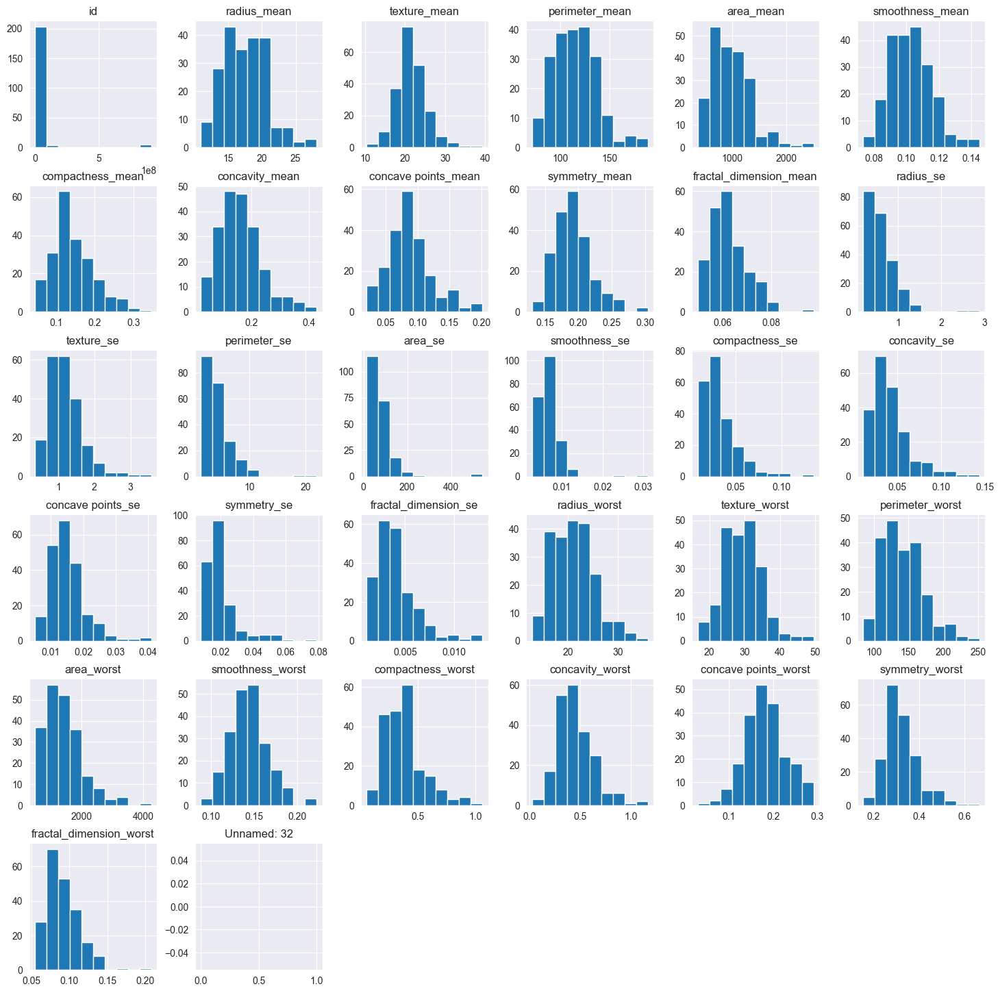

In [13]:
#Visualization of data
dataset.groupby('diagnosis').hist(figsize=(18, 18))

### As there are many columns in given dataset we try to reduce the columns. To reduce the columns choose the similar columns and diagnosis to check the relationship.To know the relationship we generate a scatter plot matrix.¶

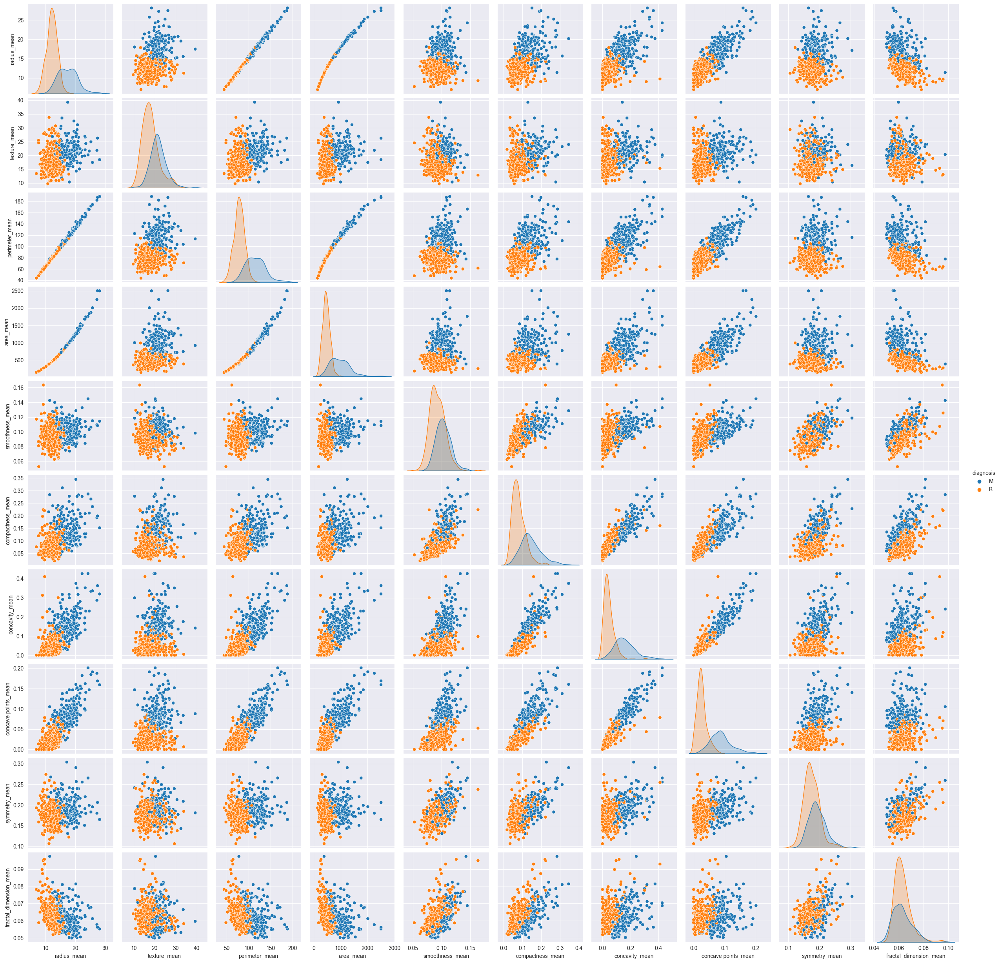

In [14]:
cols = ['diagnosis',
        'radius_mean', 
        'texture_mean', 
        'perimeter_mean', 
        'area_mean', 
        'smoothness_mean', 
        'compactness_mean', 
        'concavity_mean',
        'concave points_mean', 
        'symmetry_mean', 
        'fractal_dimension_mean']

sns.pairplot(dataset[cols], hue='diagnosis')
plt.show()

## We have observed that (radius,perimeter,area) attributes are hinting the presence of multicollinearity between these variables. Another set is (concavity,concave_points and compactness) Now we will generate a matrix similar to the above but instead of scatter plot we will display the correlations between the variables.Correlation matrix with all variables(mean, standard errors,worst)

In [15]:
# to generate and visualize the correlation matrix
corr = dataset.corr().round(2)

C:\Users\Parimala Ramisetty\AppData\Local\Temp\ipykernel_11092\2271140242.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dataset.corr().round(2)


In [16]:
# Mask for the upper triangle
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

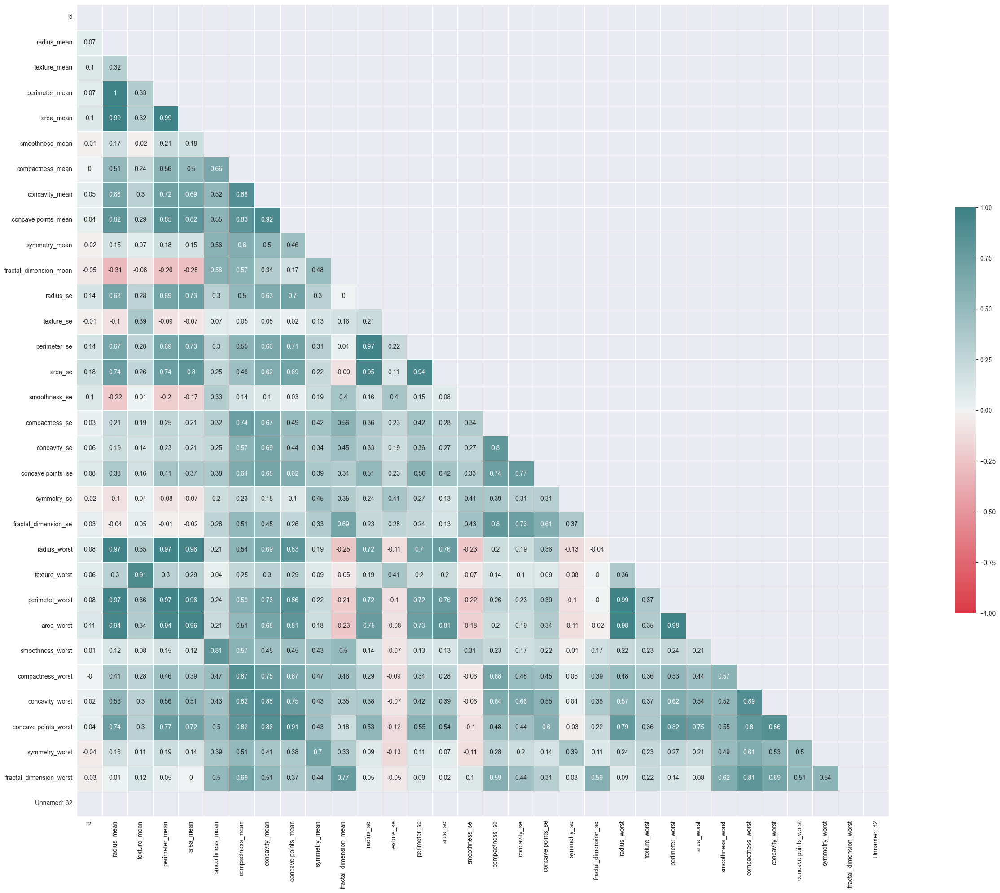

In [17]:
f, ax = plt.subplots(figsize=(30, 20))
cmap = sns.diverging_palette(10, 200, as_cmap=True)
# Draw the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.tight_layout()

# from the above we can verify that the presence of multicollinearity between some variables radius has correlation of 1 and 0.99 with perimeter and area. this is bcoz they almost has same info of size. Therefore we can pick anyone of it. we can also see that there is multicollinearity between the mean and worst column(radius_worst,radius_mean-0.97). As worst columns are subset of mean col we can drop worst col from our analysis and only focus on the mean cols. Which attribute choose from 3?It would be radius bcoz it is basic building block of its size.similary we have multicollinearity between(compactness,concavity,concave points) from three we choose compactness bcoz it gives info of shape 

In [18]:
cols = ['radius_worst', 
        'texture_worst', 
        'perimeter_worst', 
        'area_worst', 
        'smoothness_worst', 
        'compactness_worst', 
        'concavity_worst',
        'concave points_worst', 
        'symmetry_worst', 
        'fractal_dimension_worst']
dataset = dataset.drop(cols, axis=1)

In [19]:
cols = ['perimeter_mean',
        'perimeter_se', 
        'area_mean', 
        'area_se']
dataset = dataset.drop(cols, axis=1)

In [20]:
cols = ['concavity_mean',
        'concavity_se', 
        'concave points_mean', 
        'concave points_se']
dataset = dataset.drop(cols, axis=1)

C:\Users\Parimala Ramisetty\AppData\Local\Temp\ipykernel_11092\123430934.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = dataset.corr().round(2)


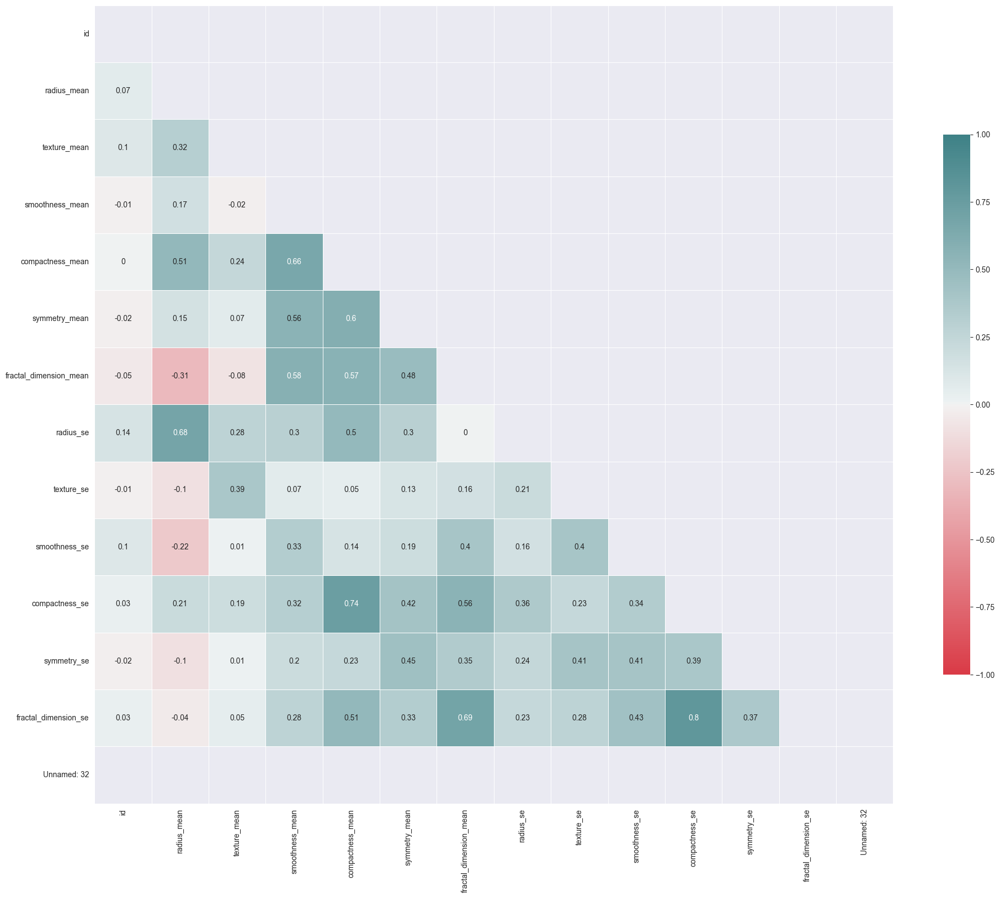

In [21]:
#new correlation matrix
corr = dataset.corr().round(2)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.tight_layout()

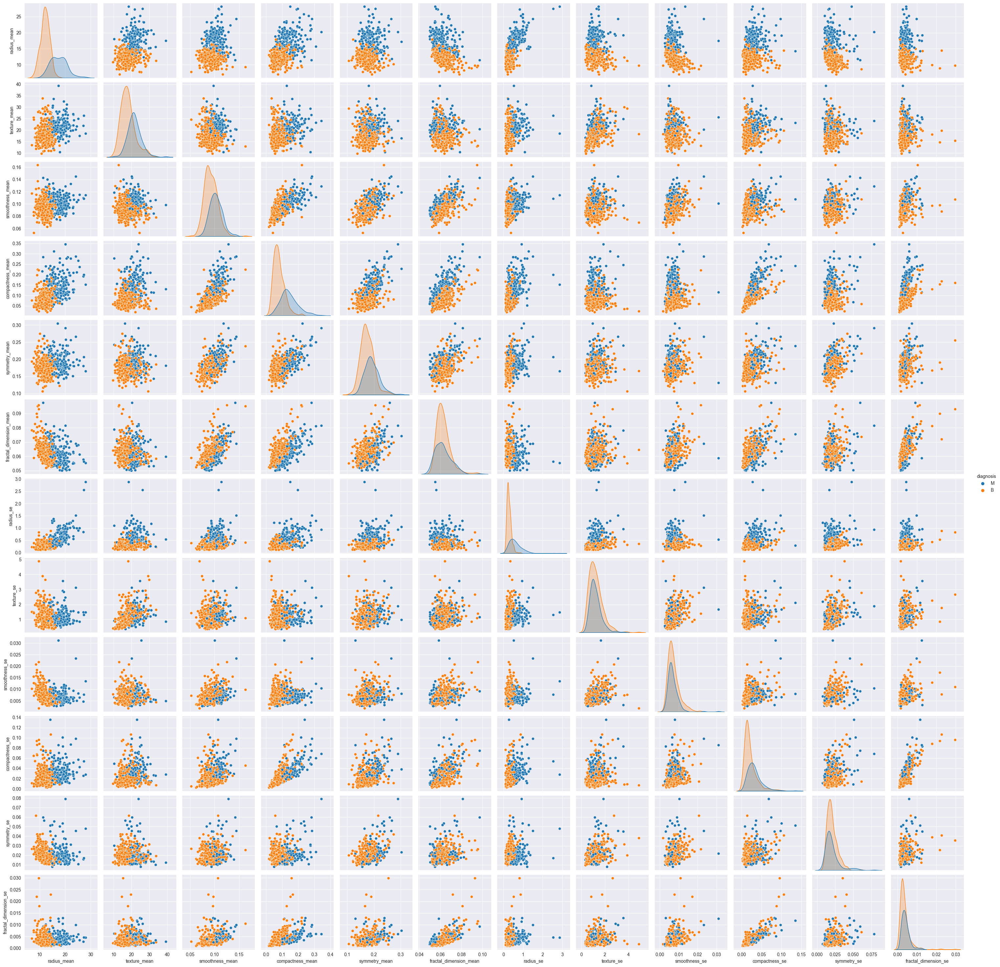

In [22]:
cols = ["diagnosis", 
        "radius_mean", 
        "texture_mean",
        "smoothness_mean",
        "compactness_mean",
        "symmetry_mean",
        "fractal_dimension_mean",
        "radius_se",
        "texture_se",
        "smoothness_se",
        "compactness_se",
        "symmetry_se",
        "fractal_dimension_se"]
sns.pairplot(dataset[cols], hue="diagnosis")
plt.show()

In [23]:
dataframe = pd.DataFrame(Y)

In [24]:
#Encoding categorical data values
from sklearn.preprocessing import LabelEncoder
labelencoder_Y = LabelEncoder()
dataset.diagnosis = labelencoder_Y.fit_transform(dataset.diagnosis)
dataset.diagnosis

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int32

In [25]:
print(dataset.diagnosis.value_counts())
print("\n", dataset.diagnosis.value_counts().sum())

0    357
1    212
Name: diagnosis, dtype: int64

 569


In [26]:
#finding the correlations for mean features
cols = ['diagnosis', 
        'radius_mean', 
        'texture_mean',
        'smoothness_mean', 
        'compactness_mean',
        'symmetry_mean', 
        'fractal_dimension_mean', 
        "radius_se",
        "texture_se",
        "smoothness_se",
        "compactness_se",
        "symmetry_se",
        "fractal_dimension_se"]
print(len(cols))
dataset[cols].corr()

13


,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,symmetry_se,fractal_dimension_se
diagnosis,1.000000,0.730029,0.415185,0.358560,0.596534,0.330499,-0.012838,0.567134,-0.008303,-0.067016,0.292999,-0.006522,0.077972
radius_mean,0.730029,1.000000,0.323782,0.170581,0.506124,0.147741,-0.311631,0.679090,-0.097317,-0.222600,0.206000,-0.104321,-0.042641
texture_mean,0.415185,0.323782,1.000000,-0.023389,0.236702,0.071401,-0.076437,0.275869,0.386358,0.006614,0.191975,0.009127,0.054458
smoothness_mean,0.358560,0.170581,-0.023389,1.000000,0.659123,0.557775,0.584792,0.301467,0.068406,0.332375,0.318943,0.200774,0.283607
compactness_mean,0.596534,0.506124,0.236702,0.659123,1.000000,0.602641,0.565369,0.497473,0.046205,0.135299,0.738722,0.229977,0.507318
symmetry_mean,0.330499,0.147741,0.071401,0.557775,0.602641,1.000000,0.479921,0.303379,0.128053,0.187321,0.421659,0.449137,0.331786
fractal_dimension_mean,-0.012838,-0.311631,-0.076437,0.584792,0.565369,0.479921,1.000000,0.000111,0.164174,0.401964,0.559837,0.345007,0.688132
radius_se,0.567134,0.679090,0.275869,0.301467,0.497473,0.303379,0.000111,1.000000,0.213247,0.164514,0.356065,0.240567,0.227754
texture_se,-0.008303,-0.097317,0.386358,0.068406,0.046205,0.128053,0.164174,0.213247,1.000000,0.397243,0.231700,0.411621,0.279723
smoothness_se,-0.067016,-0.222600,0.006614,0.332375,0.135299,0.187321,0.401964,0.164514,0.397243,1.000000,0.336696,0.413506,0.427374


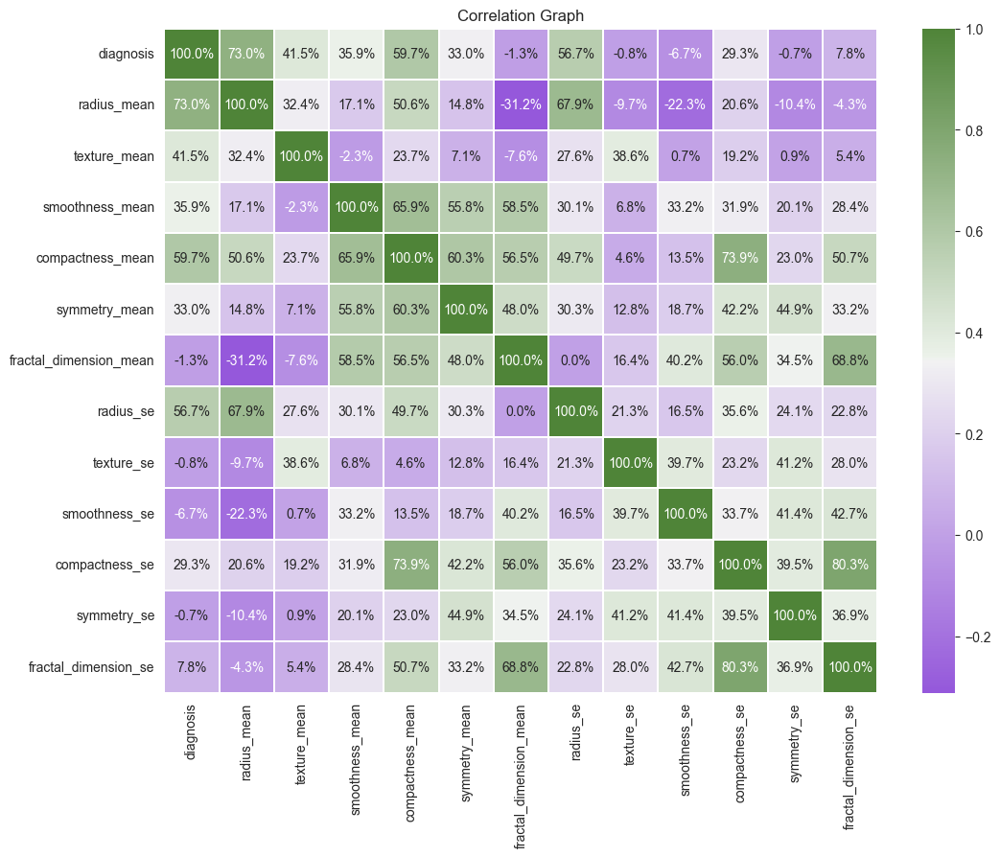

In [27]:
plt.figure(figsize=(12, 9))

plt.title("Correlation Graph")

cmap = sns.diverging_palette( 1000, 120, as_cmap=True)
sns.heatmap(dataset[cols].corr(), annot=True, fmt='.1%',  linewidths=.05, cmap=cmap);

In [28]:
#using plotly
plt.figure(figsize=(15, 10))
fig = px.imshow(dataset[cols].corr());
fig.show()

<Figure size 1500x1000 with 0 Axes>

In [29]:
#train test splitting
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.svm import SVC
from sklearn import metrics

In [30]:
#train test splitting
prediction_feature = [ "radius_mean",
                      'texture_mean', 
                      'smoothness_mean', 
                      'compactness_mean',
                      'symmetry_mean',
                      'fractal_dimension_mean', 
                      "radius_se",
                      "texture_se",
                      "smoothness_se",
                      "compactness_se",
                      "symmetry_se",
                      "fractal_dimension_se"]
targeted_feature = 'diagnosis'
len(prediction_feature)

12

In [31]:
#spliting ths data into training and testing sets
X = dataset[prediction_feature]
X

,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,symmetry_se,fractal_dimension_se
0,17.99,10.38,0.11840,0.27760,0.2419,0.07871,1.0950,0.9053,0.006399,0.04904,0.03003,0.006193
1,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01389,0.003532
2,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.02250,0.004571
3,11.42,20.38,0.14250,0.28390,0.2597,0.09744,0.4956,1.1560,0.009110,0.07458,0.05963,0.009208
4,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.01756,0.005115
...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,0.11100,0.11590,0.1726,0.05623,1.1760,1.2560,0.010300,0.02891,0.01114,0.004239
565,20.13,28.25,0.09780,0.10340,0.1752,0.05533,0.7655,2.4630,0.005769,0.02423,0.01898,0.002498
566,16.60,28.08,0.08455,0.10230,0.1590,0.05648,0.4564,1.0750,0.005903,0.03731,0.01318,0.003892
567,20.60,29.33,0.11780,0.27700,0.2397,0.07016,0.7260,1.5950,0.006522,0.06158,0.02324,0.006185


In [32]:
y = dataset.diagnosis
y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int32

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)

In [34]:
#Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [35]:
def model_building(model, X_train, X_test, y_train, y_test):
    """
    
    Model Fitting, Prediction And Other stuff
    return ('score', 'accuracy_score', 'predictions' )
    """
    
    model.fit(X_train, y_train)
    score = model.score(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(predictions, y_test)
    return (score, accuracy, predictions)    

In [36]:
models_list = {
    "LogisticRegression" :  LogisticRegression(random_state=0),
    "K-NearestNeighbor" :  KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2),
    "SVC" :  SVC(kernel = 'rbf', random_state = 2,C = 2),
    "SVM" :  SVC(kernel = 'linear', random_state = 0),
    "NaiveBayes" :  GaussianNB(),
    "DecisionTreeClassifier" :  DecisionTreeClassifier(criterion='entropy', random_state=0),
    "RandomForestClassifier" :  RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0),
}

In [37]:
print(list(models_list.keys()))
print()
print(list(models_list.values()))

['LogisticRegression', 'K-NearestNeighbor', 'SVC', 'SVM', 'NaiveBayes', 'DecisionTreeClassifier', 'RandomForestClassifier']

[LogisticRegression(random_state=0), KNeighborsClassifier(), SVC(C=2, random_state=2), SVC(kernel='linear', random_state=0), GaussianNB(), DecisionTreeClassifier(criterion='entropy', random_state=0), RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)]


In [38]:
def cm_metrix_graph(cm):
    
    sns.heatmap(cm,annot=True,fmt="d")
    plt.show()

In [39]:
df_prediction = []
confusion_matrixs = []
df_prediction_cols = [ 'model_name', 'score', 'accuracy_score' , "accuracy_percentage"]

for name, model in zip(list(models_list.keys()), list(models_list.values())):
    
    (score, accuracy, predictions) = model_building(model, X_train, X_test, y_train, y_test )
    
    print("\n\nClassification Report of '"+ str(name), "'\n")
    
    print(classification_report(y_test, predictions))

    df_prediction.append([name, score, accuracy, "{0:.2%}".format(accuracy)])
    
    # For Showing Metrics
    confusion_matrixs.append(confusion_matrix(y_test, predictions))
    
        
df_pred = pd.DataFrame(df_prediction, columns=df_prediction_cols)



Classification Report of 'LogisticRegression '

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       115
           1       0.92      0.96      0.94        56

    accuracy                           0.96       171
   macro avg       0.95      0.96      0.95       171
weighted avg       0.96      0.96      0.96       171



Classification Report of 'K-NearestNeighbor '

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       115
           1       0.98      0.91      0.94        56

    accuracy                           0.96       171
   macro avg       0.97      0.95      0.96       171
weighted avg       0.97      0.96      0.96       171



Classification Report of 'SVC '

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       115
           1       0.93      0.96      0.95        56

    accuracy                           0.96     

In [40]:
print(len(confusion_matrixs))

7


In [41]:
df_pred

,model_name,score,accuracy_score,accuracy_percentage
0,LogisticRegression,0.934673,0.959064,95.91%
1,K-NearestNeighbor,0.937186,0.964912,96.49%
2,SVC,0.962312,0.964912,96.49%
3,SVM,0.932161,0.959064,95.91%
4,NaiveBayes,0.912060,0.929825,92.98%
5,DecisionTreeClassifier,1.000000,0.883041,88.30%
6,RandomForestClassifier,0.994975,0.918129,91.81%


In [42]:
df_pred.sort_values('score', ascending=False)

,model_name,score,accuracy_score,accuracy_percentage
5,DecisionTreeClassifier,1.000000,0.883041,88.30%
6,RandomForestClassifier,0.994975,0.918129,91.81%
2,SVC,0.962312,0.964912,96.49%
1,K-NearestNeighbor,0.937186,0.964912,96.49%
0,LogisticRegression,0.934673,0.959064,95.91%
3,SVM,0.932161,0.959064,95.91%
4,NaiveBayes,0.912060,0.929825,92.98%


In [43]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,predictions)
print(cm)

[[108   7]
 [  7  49]]


In [44]:
model = SVC(kernel = 'rbf', random_state = 2)
model.fit(X_train,y_train)
prediction = model.predict(X_test)

In [49]:
import random
a = random.random()
meanR=round(random.uniform(0,30),3)
meanT=round(random.uniform(0,50),3)
meanS=round(random.uniform(0,1),5)
meanC=round(random.uniform(0,1),5)
meanSy=round(random.uniform(0,1),4)
meanF=round(random.uniform(0,1),5)
seR=round(random.uniform(0,2),4)
seT=round(random.uniform(0,3),4)
seS=round(random.uniform(0,1),6)
seC=round(random.uniform(0,1),6)
seSy=round(random.uniform(0,1),6)
seF=round(random.uniform(0,1),6)
input_1=[]
lst =  map(lambda x : x[1], filter(lambda x : x[0].startswith('mean'), globals().items()))
for i in lst:
    input_1.append(i)
lst1 =  map(lambda x : x[1], filter(lambda x : x[0].startswith('se'), globals().items()))
for i in lst1:
    input_1.append(i)
input_array = np.asarray(input_1)
input_reshaped = input_array.reshape(1,-1)
predict = model.predict(input_reshaped)
if (predict[0] < 0.5):
  print("breast cancer is malignant")
else:
   print("breast cancer is benign")


breast cancer is benign


In [50]:
#predicting individual accuracy based on cm
print("accuracy with breast cancer = ",cm[0,0]/(cm[0,0]+cm[1,0]))
print("accuracy without breast cancer = ",cm[1,1]/(cm[0,1]+cm[1,0]))

accuracy with breast cancer =  0.9391304347826087
accuracy without breast cancer =  3.5


In [51]:
import random
a = random.random()
meanR=round(random.uniform(0,30),3)
meanT=round(random.uniform(0,50),3)
meanS=round(random.uniform(0,1),5)
meanC=round(random.uniform(0,1),5)
meanSy=round(random.uniform(0,1),4)
meanF=round(random.uniform(0,1),5)
seR=round(random.uniform(0,2),4)
seT=round(random.uniform(0,3),4)
seS=round(random.uniform(0,1),6)
seC=round(random.uniform(0,1),6)
seSy=round(random.uniform(0,1),6)
seF=round(random.uniform(0,1),6)
input_2=[]
lst =  map(lambda x : x[1], filter(lambda x : x[0].startswith('mean'), globals().items()))
for i in lst:
    input_2.append(i)
lst1 =  map(lambda x : x[1], filter(lambda x : x[0].startswith('se'), globals().items()))
for i in lst1:
    input_2.append(i)
input_array = np.asarray(input_2)
input_reshaped = input_array.reshape(1,-1)
predict = model.predict(input_reshaped)
if (predict[0] == 1):
  print("breast cancer is malignant and more chances to occur")
else:
   print("breast cancer is benign and more chances to occur")

breast cancer is malignant and more chances to occur
